### Terminal

In [1]:
!nvidia-smi
!pip install -U tensorflow_addons==0.12.1

Tue Aug 24 20:44:43 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.119.04   Driver Version: 450.119.04   CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Imports

In [2]:
from tensorflow.keras.optimizers import *
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.losses import *
import tensorflow.keras.backend as K
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import tensorflow_addons as tfa
import numpy.random as npr
import tensorflow as tf
import pickle as pkl
import numpy as np
import os, time, gc, random

print('TF version:', tf.__version__)
seed = tf.random.Generator.from_seed(0)

try:
    gpus = tf.config.list_physical_devices('GPU')
    tf.config.experimental.set_memory_growth(gpus[0], True)
    print('Got a GPU')
except Exception as e:
    print(e)

TF version: 2.3.1
Physical devices cannot be modified after being initialized


Change logs

### TimeIt

In [3]:
class timeIt:
    def __init__(self, description):
        self.start = time.time()
        self.description = description
        self.running = True
    
    def new(self, description, verbose=True):
        self.start = time.time()
        self.description = description
        
        duration = time.time() - startTime
        if verbose:
            print('{}; {:.4f} seconds to complete'.format(self.description, duration))
        
        return duration
    
    def close(self, verbose=True):
        duration = time.time() - self.start
        if verbose:
            print('{}; {:.4f} seconds to complete'.format(self.description, duration))
            
        self.start = None
        self.description = None
        self.running = False
        return duration

sess = timeIt('testing timer')
time.sleep(0.005)
sess.close()

testing timer; 0.0060 seconds to complete


0.0060253143310546875

### Hyperparameters

In [4]:
# take in training data

reals, ds = None, None
pretrained = True

#batchSize = 32
batchSize = 16
m = 4000

m = batchSize * (m // batchSize)
imgSize = 256
zdim = 256
layerFilters = (256, 256, 256, 128, 64, 32)
nImgs = int(5e6)
p = 0.0

kimgs = 500
ada_interval = 4
pStep = ada_interval * batchSize / (kimgs * 1000)
eps = 1e-8
pplEMA = 0.0

### Funcs

Load data func

In [5]:
datasetPath = '/kaggle/input/bigart'

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=lambda x: x / 127.5 - 1)
train_generator = train_datagen.flow_from_directory(
        datasetPath,
        batch_size=batchSize)

Found 19200 images belonging to 1 classes.


### Augmentation pipeline (stolen from NVIDIA's code)

Helper funcs

In [6]:
rand_seed = lambda: tf.cast(999999999 * seed.uniform((2,)), 'int32')
toNCHW = lambda x: tf.transpose(x, [0, 3, 1, 2])
toNHWC = lambda x: tf.transpose(x, [0, 2, 3, 1])

#----------------------------------------------------------------------------
# Helper for randomly gating augmentation parameters based on the given probability.

def gate_augment_params(probability, params, disabled_val):
    shape = tf.shape(params)
    cond = (tf.random.stateless_uniform(shape[:len(shape)], seed=rand_seed()) < probability)
    disabled_val = tf.broadcast_to(tf.convert_to_tensor(disabled_val, dtype=params.dtype), shape)
    return tf.where(cond, params, disabled_val)

#----------------------------------------------------------------------------
# Helpers for constructing batched transformation matrices.

def construct_batch_of_matrices(*rows):
    rows = [[tf.convert_to_tensor(x, dtype=tf.float32) for x in r] for r in rows]
    batch_elems = [x for r in rows for x in r if x.shape.rank != 0]
    assert all(x.shape.rank == 1 for x in batch_elems)
    batch_size = tf.shape(batch_elems[0])[0] if len(batch_elems) else 1
    rows = [[tf.broadcast_to(x, [batch_size]) for x in r] for r in rows]
    return tf.transpose(rows, [2, 0, 1])

def translate_2d(tx, ty):
    return construct_batch_of_matrices(
        [1, 0, tx],
        [0, 1, ty],
        [0, 0, 1])

def translate_3d(tx, ty, tz):
    return construct_batch_of_matrices(
        [1, 0, 0, tx],
        [0, 1, 0, ty],
        [0, 0, 1, tz],
        [0, 0, 0, 1])

def scale_2d(sx, sy):
    return construct_batch_of_matrices(
        [sx, 0,  0],
        [0,  sy, 0],
        [0,  0,  1])

def scale_3d(sx, sy, sz):
    return construct_batch_of_matrices(
        [sx, 0,  0,  0],
        [0,  sy, 0,  0],
        [0,  0,  sz, 0],
        [0,  0,  0,  1])

def rotate_2d(theta):
    return construct_batch_of_matrices(
        [tf.cos(theta), tf.sin(-theta), 0],
        [tf.sin(theta), tf.cos(theta),  0],
        [0,             0,              1])

def rotate_3d(v, theta):
    vx = v[..., 0]; vy = v[..., 1]; vz = v[..., 2]
    s = tf.sin(theta); c = tf.cos(theta); cc = 1 - c
    return construct_batch_of_matrices(
        [vx*vx*cc+c,    vx*vy*cc-vz*s, vx*vz*cc+vy*s, 0],
        [vy*vx*cc+vz*s, vy*vy*cc+c,    vy*vz*cc-vx*s, 0],
        [vz*vx*cc-vy*s, vz*vy*cc+vx*s, vz*vz*cc+c,    0],
        [0,             0,             0,             1])

def translate_2d_inv(tx, ty):
    return translate_2d(-tx, -ty)

def scale_2d_inv(sx, sy):
    return scale_2d(1/sx, 1/sy)

def rotate_2d_inv(theta):
    return rotate_2d(-theta)

Coeffs

In [7]:
strength         = 0.0           # Overall multiplier for augmentation probability; can be a Tensor.
debug_percentile = None        # Percentile value for visualizing parameter ranges; None = normal operation.

# Pixel blitting.
xflip            = 1           # Probability multiplier for x-flip.
rotate90         = 1           # Probability multiplier for 90 degree rotations.
xint             = 1           # Probability multiplier for integer translation.
xint_max         = 0.125       # Range of integer translation relative to image dimensions.

# General geometric transformations.
scale            = 1           # Probability multiplier for isotropic scaling.
rotate           = 1           # Probability multiplier for arbitrary rotation.
aniso            = 1           # Probability multiplier for anisotropic scaling.
xfrac            = 1           # Probability multiplier for fractional translation.
scale_std        = 0.2         # Log2 standard deviation of isotropic scaling.
rotate_max       = 1           # Range of arbitrary rotation 1 = full circle.
aniso_std        = 0.2         # Log2 standard deviation of anisotropic scaling.
xfrac_std        = 0.125       # Standard deviation of frational translation relative to image dimensions.
brightness       = 1           # Probability multiplier for brightness.
contrast         = 1           # Probability multiplier for contrast.
lumaflip         = 1           # Probability multiplier for luma flip.
hue              = 1           # Probability multiplier for hue rotation.
saturation       = 1           # Probability multiplier for saturation.
brightness_std   = 0.2         # Standard deviation of brightness.
contrast_std     = 0.5         # Log2 standard deviation of contrast.
hue_max          = 1           # Range of hue rotation, 1 = full circle.
saturation_std   = 1           # Log2 standard deviation of saturation.

sym6 = [0.015404109327027373, 0.0034907120842174702, -0.11799011114819057, -0.048311742585633, 0.4910559419267466, 0.787641141030194, 0.3379294217276218, -0.07263752278646252, -0.021060292512300564, 0.04472490177066578, 0.0017677118642428036, -0.007800708325034148]

Blit + Geom Pipeline

In [8]:
@tf.function
def blit_geom_aug(images, strength, mode_out='nchw', mode_in='nhwc'):
    batch_seed = rand_seed()
    
    if mode_in.lower() == 'nhwc':
        images = toNCHW(images)
        
    batch, channels, height, width = images.shape
    if batch is None:
        batch = tf.shape(images)[0]

    # -------------------------------------
    # Select parameters for pixel blitting.
    # -------------------------------------

    # Initialize inverse homogeneous 2D transform: G_inv @ pixel_out ==> pixel_in
    I_3 = tf.eye(3, batch_shape=[batch])
    G_inv = I_3

    # Apply x-flip with probability (xflip * strength).
    i = tf.floor(tf.random.stateless_uniform([batch], batch_seed, 0, 2))
    i = gate_augment_params(xflip * strength, i, 0)
    if debug_percentile is not None:
        i = tf.floor(tf.broadcast_to(debug_percentile, [batch]) * 2)
    G_inv @= scale_2d_inv(1 - 2 * i, 1)

    # Apply 90 degree rotations with probability (rotate90 * strength).
    if rotate90 > 0:
        i = tf.floor(tf.random.stateless_uniform([batch], batch_seed, 0, 4))
        i = gate_augment_params(rotate90 * strength, i, 0)
        if debug_percentile is not None:
            i = tf.floor(tf.broadcast_to(debug_percentile, [batch]) * 4)
        G_inv @= rotate_2d_inv(-np.pi / 2 * i)

    # Apply integer translation with probability (xint * strength).
    if xint > 0:
        t = tf.random.stateless_uniform([batch, 2], batch_seed, -xint_max, xint_max)
        t = gate_augment_params(xint * strength, t, 0)
        if debug_percentile is not None:
            t = (tf.broadcast_to(debug_percentile, [batch, 2]) * 2 - 1) * xint_max
        G_inv @= translate_2d_inv(tf.round(t[:,0] * width), tf.round(t[:,1] * height))

    # --------------------------------------------------------
    # Select parameters for general geometric transformations.
    # --------------------------------------------------------

    # Apply isotropic scaling with probability (scale * strength).
    if scale > 0:
        s = 2 ** tf.random.stateless_normal([batch], batch_seed, 0, scale_std)
        s = gate_augment_params(scale * strength, s, 1)
        if debug_percentile is not None:
            s = 2 ** (tflib.erfinv(tf.broadcast_to(debug_percentile, [batch]) * 2 - 1) * scale_std)
        G_inv @= scale_2d_inv(s, s)

    # Apply pre-rotation with probability p_rot.
    p_rot = 1 - tf.sqrt(tf.cast(tf.maximum(1 - rotate * strength, 0), tf.float32)) # P(pre OR post) = p
    if rotate > 0:
        theta = tf.random.stateless_uniform([batch], batch_seed, -np.pi * rotate_max, np.pi * rotate_max)
        theta = gate_augment_params(p_rot, theta, 0)
        if debug_percentile is not None:
            theta = (tf.broadcast_to(debug_percentile, [batch]) * 2 - 1) * np.pi * rotate_max
        G_inv @= rotate_2d_inv(-theta) # Before anisotropic scaling.

    # Apply anisotropic scaling with probability (aniso * strength).
    if aniso > 0:
        s = 2 ** tf.random.stateless_normal([batch], batch_seed, 0, aniso_std)
        s = gate_augment_params(aniso * strength, s, 1)
        if debug_percentile is not None:
            s = 2 ** (tflib.erfinv(tf.broadcast_to(debug_percentile, [batch]) * 2 - 1) * aniso_std)
        G_inv @= scale_2d_inv(s, 1 / s)

    # Apply post-rotation with probability p_rot.
    if rotate > 0:
        theta = tf.random.stateless_uniform([batch], batch_seed, -np.pi * rotate_max, np.pi * rotate_max)
        theta = gate_augment_params(p_rot, theta, 0)
        if debug_percentile is not None:
            theta = tf.zeros([batch])
        G_inv @= rotate_2d_inv(-theta) # After anisotropic scaling.

    # Apply fractional translation with probability (xfrac * strength).
    if xfrac > 0:
        t = tf.random.stateless_normal([batch, 2], batch_seed, 0, xfrac_std)
        t = gate_augment_params(xfrac * strength, t, 0)
        if debug_percentile is not None:
            t = tflib.erfinv(tf.broadcast_to(debug_percentile, [batch, 2]) * 2 - 1) * xfrac_std
        G_inv @= translate_2d_inv(t[:,0] * width, t[:,1] * height)

    # ----------------------------------
    # Execute geometric transformations.
    # ----------------------------------

    # Execute if the transform is not identity.
    if G_inv is not I_3:
        # Setup orthogonal lowpass filter.
        Hz = sym6
        Hz = np.asarray(Hz, dtype=np.float32)
        Hz = np.reshape(Hz, [-1, 1, 1]).repeat(channels, axis=1) # [tap, channel, 1]
        Hz_pad = Hz.shape[0] // 4

        # Calculate padding.
        cx = (width - 1) / 2
        cy = (height - 1) / 2
        cp = np.transpose([[-cx, -cy, 1], [cx, -cy, 1], [cx, cy, 1], [-cx, cy, 1]]) # [xyz, idx]
        cp = G_inv @ cp[np.newaxis] # [batch, xyz, idx]
        cp = cp[:, :2, :] # [batch, xy, idx]
        m_lo = tf.math.ceil(tf.reduce_max(-cp, axis=[0,2]) - [cx, cy] + Hz_pad * 2)
        m_hi = tf.math.ceil(tf.reduce_max( cp, axis=[0,2]) - [cx, cy] + Hz_pad * 2)
        m_lo = tf.clip_by_value(m_lo, [0, 0], [width-1, height-1])
        m_hi = tf.clip_by_value(m_hi, [0, 0], [width-1, height-1])

        # Pad image and adjust origin.
        images = tf.transpose(images, [0, 2, 3, 1]) # NCHW => NHWC
        pad = [[0, 0], [m_lo[1], m_hi[1]], [m_lo[0], m_hi[0]], [0, 0]]
        images = tf.pad(tensor=images, paddings=pad, mode='REFLECT')
        T_in = translate_2d(cx + m_lo[0], cy + m_lo[1])
        T_out = translate_2d_inv(cx + Hz_pad, cy + Hz_pad)
        G_inv = T_in @ G_inv @ T_out

        # Upsample.
        shape = [batch, tf.shape(images)[1] * 2, tf.shape(images)[2] * 2, channels]
        images = tf.nn.depthwise_conv2d_backprop_input(input_sizes=shape, filter=Hz[np.newaxis, :], out_backprop=images, strides=[1,2,2,1], padding='SAME', data_format='NHWC')
        images = tf.nn.depthwise_conv2d_backprop_input(input_sizes=shape, filter=Hz[:, np.newaxis], out_backprop=images, strides=[1,1,1,1], padding='SAME', data_format='NHWC')
        G_inv = scale_2d(2, 2) @ G_inv @ scale_2d_inv(2, 2) # Account for the increased resolution.

        # Execute transformation.
        transforms = tf.reshape(G_inv, [-1, 9])[:, :8]
        shape = [(height + Hz_pad * 2) * 2, (width + Hz_pad * 2) * 2]
        images = tfa.image.transform(images=images, transforms=transforms, output_shape=shape, interpolation='BILINEAR')

        # Downsample and crop.
        images = tf.nn.depthwise_conv2d(input=images, filter=Hz[np.newaxis,:], strides=[1,1,1,1], padding='SAME', data_format='NHWC')
        images = tf.nn.depthwise_conv2d(input=images, filter=Hz[:,np.newaxis], strides=[1,2,2,1], padding='SAME', data_format='NHWC')
        images = images[:, Hz_pad : height + Hz_pad, Hz_pad : width + Hz_pad, :]
        
    if mode_out.lower() == 'nchw':
        images = toNCHW(images)
    
    return images

Color pipeline

In [9]:
@tf.function
def color_aug(images, strength, mode_out='nhwc', mode_in='nchw'):
    batch_seed = rand_seed()
    
    if mode_in.lower() == 'nhwc':
        images = toNCHW(images)
        
    batch, channels, height, width = images.shape
    # Initialize homogeneous 3D transformation matrix: C @ color_in ==> color_out
    I_4 = tf.eye(4, batch_shape=[batch])
    C = I_4

    # Apply brightness with probability (brightness * strength).
    if brightness > 0:
        b = tf.random.stateless_normal([batch], batch_seed, 0, brightness_std)
        b = gate_augment_params(brightness * strength, b, 0)
        if debug_percentile is not None:
            b = tflib.erfinv(tf.broadcast_to(debug_percentile, [batch]) * 2 - 1) * brightness_std
        C = translate_3d(b, b, b) @ C

    # Apply contrast with probability (contrast * strength).
    if contrast > 0:
        c = 2 ** tf.random.stateless_normal([batch], batch_seed, 0, contrast_std)
        c = gate_augment_params(contrast * strength, c, 1)
        if debug_percentile is not None:
            c = 2 ** (tflib.erfinv(tf.broadcast_to(debug_percentile, [batch]) * 2 - 1) * contrast_std)
        C = scale_3d(c, c, c) @ C

    # Apply luma flip with probability (lumaflip * strength).
    v = np.array([1, 1, 1, 0]) / np.sqrt(3) # Luma axis.
    if lumaflip > 0:
        i = tf.floor(tf.random.stateless_uniform([batch], batch_seed, 0, 2))
        i = gate_augment_params(lumaflip * strength, i, 0)
        if debug_percentile is not None:
            i = tf.floor(tf.broadcast_to(debug_percentile, [batch]) * 2)
        i = tf.reshape(i, [batch, 1, 1])
        C = (I_4 - 2 * np.outer(v, v) * i) @ C # Householder reflection.

    # Apply hue rotation with probability (hue * strength).
    if hue > 0 and channels > 1:
        theta = tf.random.stateless_uniform([batch], batch_seed, -np.pi * hue_max, np.pi * hue_max)
        theta = gate_augment_params(hue * strength, theta, 0)
        if debug_percentile is not None:
            theta = (tf.broadcast_to(debug_percentile, [batch]) * 2 - 1) * np.pi * hue_max
        C = rotate_3d(v, theta) @ C # Rotate around v.

    # Apply saturation with probability (saturation * strength).
    if saturation > 0 and channels > 1:
        s = 2 ** tf.random.stateless_normal([batch], batch_seed, 0, saturation_std)
        s = gate_augment_params(saturation * strength, s, 1)
        if debug_percentile is not None:
            s = 2 ** (tflib.erfinv(tf.broadcast_to(debug_percentile, [batch]) * 2 - 1) * saturation_std)
        s = tf.reshape(s, [batch, 1, 1])
        C = (np.outer(v, v) + (I_4 - np.outer(v, v)) * s) @ C

    # ------------------------------
    # Execute color transformations.
    # ------------------------------

    # Execute if the transform is not identity.
    if C is not I_4:
        images = tf.reshape(images, [batch, channels, height * width])
        if channels == 3:
            images = C[:, :3, :3] @ images + C[:, :3, 3:]
        elif channels == 1:
            C = tf.reduce_mean(C[:, :3, :], axis=1, keepdims=True)
            images = images * tf.reduce_sum(C[:, :, :3], axis=2, keepdims=True) + C[:, :, 3:]
        else:
            raise ValueError('Image must be RGB (3 channels) or L (1 channel)')
        images = tf.reshape(images, [batch, channels, height, width])
        
    if mode_out.lower() == 'nhwc':
        images = toNHWC(images)
    
    return images

Full Pipeline

In [10]:
def aug(imgs, p):
    imgs = blit_geom_aug(imgs, p)
    imgs = color_aug(imgs, p)
    return imgs

Augmentation test

tf.Tensor(0.7592711, shape=(), dtype=float32)
tf.Tensor(-0.5680563, shape=(), dtype=float32)


/opt/conda/lib/python3.7/site-packages/tensorflow/python/autograph/impl/api.py:493: UserWarning: fill_value is not supported and is always 0 for TensorFlow < 2.4.0.
  return py_builtins.overload_of(f)(*args)


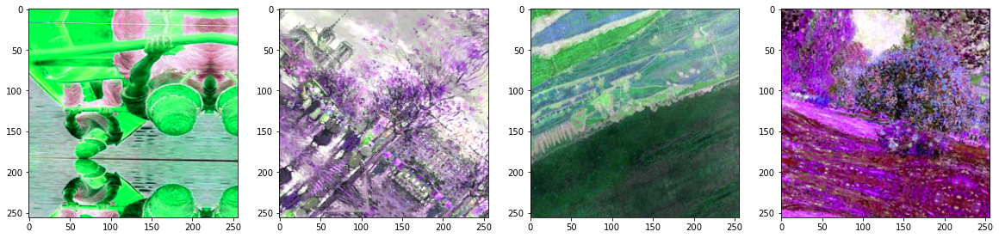

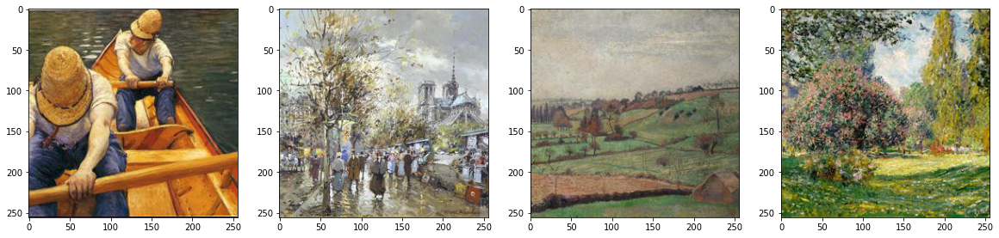

In [11]:
p = 1
augtest = tf.function()(lambda batch, p: aug(batch, p))
rs = tf.function()(lambda: tf.random.stateless_normal((), rand_seed()))
print(rs())
print(rs())
batch = next(train_generator)[0]
aug_batch = augtest(batch, tf.convert_to_tensor(p, 'float32'))
aug_batch = aug_batch / 2 + 0.5
fig, axes = plt.subplots(1, 4, figsize=(20, 10))
axes[0].imshow(aug_batch[0])
axes[1].imshow(aug_batch[1])
axes[2].imshow(aug_batch[2])
axes[3].imshow(aug_batch[3])
plt.show()

batch = batch / 2 + 0.5
fig, axes = plt.subplots(1, 4, figsize=(20, 10))
axes[0].imshow(batch[0])
axes[1].imshow(batch[1])
axes[2].imshow(batch[2])
axes[3].imshow(batch[3])
plt.show()
p = 0.0

### Layers

Low-level layers

In [12]:
# blocks used in GAN

s_lrelu = lambda x: LeakyReLU(alpha=0.2)(x) * np.sqrt(2) # scaled lrelu
ndist = tf.random_normal_initializer(0, 1)
zeros = tf.zeros_initializer()
ones = tf.ones_initializer()

def minibatchStd(x, group_size=None, num_new_features=1):
    if group_size is None:
        group_size = tf.shape(x)[0]
    else:
        group_size = tf.minimum(group_size, tf.shape(x)[0]) # Minibatch must be divisible by (or smaller than) group_size.

    G = group_size
    F = num_new_features
    _N, C, H, W = x.shape.as_list()
    c = C // F

    y = tf.cast(x, tf.float32)                # [NCHW]   Cast to FP32.
    y = tf.reshape(y, [G, -1, F, c, H, W])    # [GnFcHW] Split minibatch N into n groups of size G, and channels C into F groups of size c.
    y -= tf.reduce_mean(y, axis=0)            # [GnFcHW] Subtract mean over group.
    y = tf.reduce_mean(tf.square(y), axis=0)  # [nFcHW]  Calc variance over group.
    y = tf.sqrt(y + eps)                     # [nFcHW]  Calc stddev over group.
    y = tf.reduce_mean(y, axis=[2,3,4])       # [nF]     Take average over channels and pixels.
    y = tf.cast(y, x.dtype)                   # [nF]     Cast back to original data type.
    y = tf.reshape(y, [-1, F, 1, 1])          # [nF11]   Add missing dimensions.
    y = tf.tile(y, [G, 1, H, W])              # [NFHW]   Replicate over group and pixels.
    return tf.concat([x, y], axis=1)          # [NCHW]   Append to input as new channels.

class DiffUS(tf.keras.layers.Layer):
    def __init__(self, up=2, pad0=2, pad1=1):
        super().__init__()
        self.up = up
            
        self.pad0, self.pad1 = pad0, pad1 
        self._get_kernel()
    
    def _get_kernel(self):
        k = np.array([1, 3, 3, 1])
        k = k / np.sum(k)
        k = np.outer(k, k)
        k *= self.up ** 2
        
        self.w = tf.convert_to_tensor(k[:, :, np.newaxis, np.newaxis], dtype='float32')
        
    def call(self, inputs):
        N, _C, H, W = inputs.shape.as_list()
        C = tf.shape(inputs)[1]
        
        # Upsample (insert zeros).
        x = tf.reshape(inputs, [-1, C, H, 1, W, 1])
        x = tf.pad(x, [[0, 0], [0, 0], [0, 0], [0, self.up - 1], [0, 0], [0, self.up - 1]])
        x = tf.reshape(x, [-1, C, H * self.up, W * self.up])

        # Pad
        x = tf.pad(x, [[0, 0], [0, 0], [self.pad0, self.pad1], [self.pad0, self.pad1]])

        # Convolve with filter.
        x = tf.reshape(x, [-1, 1, H * self.up + self.pad0 + self.pad1, W * self.up + self.pad0 + self.pad1])
        x = tf.nn.conv2d(x, tf.cast(self.w, x.dtype), strides=[1,1,1,1], padding='VALID', data_format='NCHW')
        pad_const = self.pad0 + self.pad1 - self.w.shape[0] + 1
        x = tf.reshape(x, [-1, C, H * self.up + pad_const, W * self.up + pad_const])
        return x
    
    def get_config(self):
        config = super().get_config()
        config.update({
            'up': self.up,
            'pad0': self.pad0,
            'pad1': self.pad1,
                      })
        return config

class NoiseAdjust(Layer):
    def __init__(self):
        super().__init__()
    
    def build(self, input_shape):
        super().build(input_shape)
        self.scale = self.add_weight(
            shape=(),
            initializer=zeros,
            trainable=True
        )
        
    def call(self, inputs):
        noise, img = inputs
        _N, _C, H, W = img.shape
        return self.scale * noise[:, :H, :W]

class ConstInput(Layer):
    def __init__(self):
        super().__init__()
        self.reduce = Dense(1)
        self.reduce.trainable = False
        self.one = Lambda(lambda x: x * 0 + 1)
        self.expand = FCE(4*4*zdim, lrelu=False, use_bias=False)
        self.reshape = Reshape((zdim, 4, 4))
        
    def build(self, input_shape):
        super().build(input_shape)
    
    def call(self, inputs):
        x = self.reduce(inputs)
        x = self.one(x)
        x = self.expand(x)
        x = self.reshape(x)
        return x

Equalized layers

In [13]:
class FCE(Dense): # fully connected equalized
    def __init__(self, units, kernel_initializer=ndist, bias_initializer=zeros, lrelu=True, *args, **kwargs):
        super().__init__(units, *args, **kwargs)
        self.kernel_initializer = kernel_initializer
        self.bias_initializer = bias_initializer
        self.lrelu = lrelu
        self.scale = 1
    
    def build(self, input_shape):
        super().build(input_shape)
        n = input_shape[-1] # input_shape = (None, features_in) or (None, dimY, dimX, features_in)
        self.scale = np.sqrt(1 / n)
    
    def call(self, inputs):
        output = K.dot(inputs, self.kernel * self.scale)
        #print('fce, use bias: {} | activation: {} | lrelu: {} | scale: {}'.format(self.use_bias, self.activation, self.lrelu, self.scale))
        if self.use_bias:
            output = K.bias_add(output, self.bias)
        if self.activation is not tf.keras.activations.linear:
            output = self.activation(output)
        elif self.lrelu:
            output = s_lrelu(output)
        return output
    
    def get_config(self):
        config = super().get_config()
        config.update({
            'kInit': self.kernel_initializer,
            'bInit': self.bias_initializer,
            'scale': self.scale,
            'useLReLU': self.lrelu,
                      })
        return config

class CVE(Conv2D):
    def __init__(self, units, kernel_size=3, kernel_initializer=ndist, bias_initializer=zeros, padding='SAME', lrelu=True, down=False, *args, **kwargs):
        super().__init__(units, kernel_size, *args, **kwargs)
        self.units = units
        self.kernel_initializer = kernel_initializer
        self.bias_initializer = bias_initializer
        self.padding = padding
        self.lrelu = lrelu
        self.scale = 1
        
        self.down = down
        if down:
            p = 1 + kernel_size
            self.downsample = DiffUS(up=1, pad0=(p+1)//2, pad1=p//2)
    
    def build(self, input_shape):
        N, C, H, W = input_shape
        super().build(input_shape)
        self.kernel = self.add_weight(shape=(*self.kernel_size, C, self.units),
                               initializer=self.kernel_initializer,
                               trainable=True)
        
        n = np.prod(self.kernel.shape[:-1]) # self.kernel.shape = (kernel_x, kernel_y, features_in, features_out)
        self.scale = np.sqrt(1 / n)
    
    def call(self, inputs):
        output = inputs
        if self.down:
            output = self.downsample(output)
            output = tf.nn.conv2d(output, self.kernel * self.scale, strides=[1,1,2,2], padding='VALID', data_format='NCHW')
        else:
            output = tf.nn.conv2d(output, self.kernel * self.scale, strides=[1,1,1,1], padding='SAME', data_format='NCHW')
        
        #print('cve, use bias: {} | activation: {} | lrelu: {} | scale: {}'.format(self.use_bias, self.activation, self.lrelu, self.scale))
        if self.use_bias:
            output = K.bias_add(output, self.bias, data_format='channels_first')
        if self.activation is not tf.keras.activations.linear:
            output = self.activation(output)
        elif self.lrelu:
            output = s_lrelu(output)
        return output
    
    def get_config(self):
        config = super().get_config()
        config.update({
            'kInit': self.kernel_initializer,
            'bInit': self.bias_initializer,
            'padding': self.padding,
            'scale': self.scale,
            'useLReLU': self.lrelu,
                      })
        return config

Modulated convoultion layer

In [14]:
class ConvMod(Layer):
    def __init__(self, nf, x, w, kSize=3, demod=True, us=False):
        super().__init__()
        self.nf = nf
        self.kSize = kSize
        self.xShape = x.shape
        self.wShape = w.shape
        self.scale = FCE(self.xShape[1], bias_initializer=ones, lrelu=False)
        self.conv = CVE(nf, kSize, lrelu=False)
        self.blur = DiffUS()
        self.blur.up = 1 # setup blur kernel with up=2, then set to 1 so it doesn't resize
        self.conv(x) # create kernel without doing it in build method so h5py doesn't go sicko mode
        self.demod = demod
        self.us = us

    def build(self, input_shape): # input_shape: [TensorShape([None, 4, 4, 256]), TensorShape([None, 256])
        super().build(input_shape)
        
    def call(self, inputs):
        x, w = inputs
        
        weight = self.conv.kernel[np.newaxis] * self.conv.scale # kkio -> 1kkio (1, kernel_size, kernel_size, input_features, output_features)
        
        scale = self.scale(w)
        scale = scale[:, np.newaxis, np.newaxis, :, np.newaxis] # Bs -> B, 1, 1, s, 1 (s - scaling factor)
        
        wp = weight * scale # 1kkio * B11s1 -> Bkk(s*i)o
        wpp = wp
        
        if self.demod:
            wStd = tf.math.rsqrt(tf.reduce_sum(tf.math.square(wp), axis=[1,2,3]) + eps) # Bkkio -> Bo
            wpp = wp * wStd[:, np.newaxis, np.newaxis, np.newaxis, :] # [BkkIO] Scale output feature maps.
            
        x = tf.reshape(x, (1, -1, x.shape[2], x.shape[3])) # Bihw-> 1, B*i, H, W
        
        # B, k, k, i, o -> k, k, i, B, o -> k, k, i, (B*o)
        wpp = tf.reshape(tf.transpose(wpp, [1, 2, 3, 0, 4]), [wpp.shape[1], wpp.shape[2], wpp.shape[3], -1])
        
        # grouped conv and optional upsampling
        if self.us:
            N, _C, H, W = x.shape
            inC = tf.shape(wpp)[2] # i
            outC = tf.shape(wpp)[3] # B*o
            output_shape = [N, outC, H*2, W*2]
            num_groups = tf.shape(x)[1] // inC # B*i / i -> B
            
            wpp = tf.reshape(wpp, [self.kSize, self.kSize, inC, num_groups, -1]) #  kkiBo
            wpp = tf.transpose(wpp, [0, 1, 4, 3, 2]) # kkoBi
            wpp = tf.reshape(wpp, [self.kSize, self.kSize, -1, num_groups * inC]) # kko(B*i)
            
            x = tf.nn.conv2d_transpose(x, wpp, output_shape, [1,1,2,2], padding='SAME', data_format='NCHW')
            x = self.blur(x)
        else:
            x = tf.nn.conv2d(x, wpp, strides=[1,1,1,1], padding='SAME', data_format='NCHW') # grouped conv
        
        x = tf.reshape(x, (-1, self.nf, x.shape[2], x.shape[3])) # 1, (N*C), H, W -> N, C, H, W    
        x = K.bias_add(x, self.conv.bias, data_format='channels_first')
        return x
    
    def get_config(self):
        config = super().get_config()
        config.update({
            'num_filters': self.nf,
            'kernel_size': self.kSize,
            'xShape': self.xShape,
            'wShape': self.wShape,
            'demodulated': self.demod,
            'upsampled': self.us,
                      })
        return config

Layer blocks

In [15]:
def gblock(accum, x, ws, noises, filters, us=True):
    if us:
        accum = DiffUS()(accum)
    
    x = ConvMod(filters, x, ws[0], us=us)([x, ws[0]])
    noise = NoiseAdjust()([noises[0], x])
    x = Add()([x, noise])
    x = s_lrelu(x)
    
    x = ConvMod(filters, x, ws[1])([x, ws[1]])
    noise = NoiseAdjust()([noises[1], x])
    x = Add()([x, noise])
    x = s_lrelu(x)

    trgb = ConvMod(3, x, ws[-1], 1, demod=False)([x, ws[-1]])
    accum = Add()([accum, trgb])
        
    return accum, x

def dblock(x, filters, maxFilters=256):
    frgb = CVE(min(2 * filters, maxFilters), 1, lrelu=False, use_bias=False, down=True)(x)
    x = CVE(filters)(x)
    x = CVE(min(2 * filters, maxFilters), down=True)(x)
    x = Add()([x, frgb]) * np.sqrt(1 / 2)
    
    return x

Model architecture

In [16]:
nBlocks = int(np.log2(imgSize / 4))
num_ws = 2 * (nBlocks + 1)
num_noises = num_ws - 1
    
def ztow(nlayers=8):
    z = Input((zdim,))
    w = z
    if nlayers > 0:
        w = w * tf.math.rsqrt(tf.reduce_mean(tf.square(w), axis=1, keepdims=True) + eps)
    for i in range(max(nlayers, 0)):
        w = FCE(zdim)(w)
    w = tf.cast(w, 'float32')
    return Model(z, w, name='mapping')

def genGen():
    ws = [Input((zdim,), name='w{}'.format(i)) for i in range(num_ws)]
    noiseInps = [Input([imgSize, imgSize], name='noiseInp{}'.format(i)) for i in range(num_noises)]

    x = ConstInput()(ws[0])
    
    x = ConvMod(layerFilters[0], x, ws[0])([x, ws[0]])
    noise = NoiseAdjust()([noiseInps[0], x])
    x = Add()([x, noise])
    x = s_lrelu(x)
    
    accum = ConvMod(3, x, ws[0], 1, demod=False)([x, ws[1]])
    w_idx = 1
    for idx, f in enumerate(layerFilters):
        accum, x = gblock(accum, x, ws[w_idx :w_idx + 3], noiseInps[w_idx: w_idx+2], f) # 3 convs -> w_idx + 3, 2 noises -> w_idx + 2
        w_idx += 2 # idk
        
    out = accum
    out = toNHWC(out)
    out = tf.cast(out, 'float32')
    return Model([ws, noiseInps], out, name='generator')
        
def genDisc():
    inp = Input((imgSize, imgSize, 3)); x = inp
    x = toNCHW(x)
    
    layF = list(reversed(layerFilters))
    x = CVE(layF[0], 1)(x)
    for fi, f in enumerate(layF):
        x = dblock(x, f, maxFilters=layF[-1])
    
    x = Lambda(minibatchStd)(x)
    x = CVE(layF[-1])(x)
    x = Flatten()(x)
    x = FCE(layF[-1])(x)
    out = FCE(1, lrelu=False)(x)
    out = tf.cast(out, 'float32')
    return Model(inp, out, name='discriminator')

Model creation

In [17]:
modelPath = '/kaggle/input/models/SGAN'
fids, gcosts, dcosts = [], [], []
gpcosts = []
pplnorms = []
ps, rts = [], []

mapper = ztow()
generator = genGen()
discriminator = genDisc()
inception = tf.keras.applications.InceptionV3(include_top=False, pooling='avg', input_shape=(256, 256, 3))

if pretrained:
    mapper.load_weights(os.path.join(modelPath, 'mapWeights.h5'))
    generator.load_weights(os.path.join(modelPath, 'genWeights.h5'))
    discriminator.load_weights(os.path.join(modelPath, 'discWeights.h5'))
    p = float(np.load(os.path.join(modelPath, 'p.npy')))
    nImgs = int(np.load(os.path.join(modelPath, 'nimgs.npy')))
    pplEMA = float(np.load(os.path.join(modelPath, 'ppl_ema.npy')))

87916544/87910968 [==============================] - 1s 0us/step


### Summaries

Mapper

In [18]:
if False:
    mapper.summary()

Generator

In [19]:
if False:
    generator.summary()

Discriminator

In [20]:
if False:
    discriminator.summary()

### Optimization

Learning rate and optimizers

In [21]:
lr = 2.5e-3
k_g = 4 # number of steps per generator regularization step
k_d = 16 # k_g but for disc
ppl_scale = k_g / (k_g + 1)
gp_scale = k_d / (k_d + 1)
mapOpt = Adam(lr / 100 * ppl_scale, 0, (0.99)**ppl_scale, epsilon=eps)
genOpt = Adam(lr * ppl_scale, 0, (0.99)**ppl_scale, epsilon=eps)
discOpt = Adam(lr * gp_scale, 0, (0.99)**gp_scale, epsilon=eps)

if pretrained:
    mapOpt = pkl.load(open(os.path.join(modelPath, 'map_opt.pkl'), 'rb'))
    genOpt = pkl.load(open(os.path.join(modelPath, 'gen_opt.pkl'), 'rb'))
    discOpt = pkl.load(open(os.path.join(modelPath, 'disc_opt.pkl'), 'rb'))

Loss funcs

In [22]:
@tf.function
def rt(truePreds):
    return tf.reduce_mean(tf.sign(truePreds))

@tf.function
def discLoss(truePreds, fakePreds):
    trueLoss = tf.reduce_mean(tf.nn.softplus(-truePreds)) # -log(sigmoid(real_scores_out)) # pylint: disable=invalid-unary-operand-type
    fakeLoss = tf.reduce_mean(tf.nn.softplus(fakePreds)) # -log(1-sigmoid(fake_scores_out))
    classLoss = trueLoss + fakeLoss
    return classLoss

@tf.function
def genLoss(fakePreds):
    classLoss = tf.reduce_mean(tf.nn.softplus(-fakePreds))
    return classLoss

Regularization

In [23]:
@tf.function
def genImgs():
    batch_seed = rand_seed()
    z1 = tf.random.stateless_normal([batchSize, zdim], dtype=tf.float16, seed=batch_seed)
    z2 = tf.random.stateless_normal([batchSize, zdim], dtype=tf.float16, seed=batch_seed)
    noise = [tf.random.stateless_normal([batchSize, imgSize, imgSize], dtype=tf.float16, seed=batch_seed) for _ in range(num_noises)]

    w1 = z1; w2 = z2
    w1 = mapper(z1)
    mapped_z2 = mapper(z2)
    use_w2 = tf.where(tf.random.stateless_uniform((batchSize,), seed=batch_seed) < 0.9, 1.0, 0.0)[:, np.newaxis]
    w2 = use_w2 * mapped_z2 + (1 - use_w2) * w1
    splitInd = npr.randint(1, num_ws)
    ws = [w1 for _ in range(splitInd)] + [w2 for _ in range(num_ws - splitInd)]
    fakes = generator([*ws, *noise])
    return fakes

@tf.function
def disc_run(imgs, p):
    aug_imgs = aug(imgs, p)
    return discriminator(aug_imgs)

@tf.function
def pplReg(ppl_ema):
    batch_seed = rand_seed()
    pplWeight = k_g * 2
    pplbatchSize = batchSize // 2
    y = tf.random.stateless_normal((pplbatchSize, imgSize, imgSize, 3), seed=batch_seed) / imgSize
    noise = [tf.random.stateless_normal((pplbatchSize, imgSize, imgSize), seed=batch_seed) for _ in range(num_noises)]
    z = tf.random.stateless_normal((pplbatchSize, zdim), seed=batch_seed)
    
    w = mapper(z)
    ws = [w for _ in range(num_ws)]
    preds = generator([*ws, *noise])
    jacLite = tf.math.reduce_sum(preds * y)
    
    pl_grads = tf.convert_to_tensor(tf.gradients(jacLite, ws))
    
    # sum of squared grads by each feature in a latent, averaged over all latents per input (axis 0 is each latent, not each training sample)
    pl_lengths = tf.sqrt(tf.reduce_mean(tf.reduce_sum(tf.square(pl_grads), axis=2), axis=0)) 
    mean_pl = tf.cast(tf.reduce_mean(pl_lengths), tf.float32)
    pl_decay = 0.01
    ppl_ema = tf.cast(pl_decay, tf.float32) * mean_pl + tf.cast(1 - pl_decay, tf.float32) * ppl_ema
    return pplWeight * tf.reduce_mean(tf.square(pl_lengths - ppl_ema)), ppl_ema

### Helper funcs

In [24]:
from scipy.linalg import sqrtm

allRealFeatures = None
def toNp(*args):
    ret = []
    for i in args:
        meanVal = i
        try:
            meanVal = meanVal.numpy()
        except:
            pass
        ret.append(meanVal)
    return ret

def add_non_nan(accums, adders):
    ret = accums[:]
    for idx, adder in enumerate(adders):
        if not np.isnan(adder):
            ret[idx] += adder
    return ret

@tf.function
def crunch(batch, bs=32):
    z = seed.normal((bs, zdim))
    noise = [seed.normal((bs, imgSize, imgSize)) for _ in range(num_noises)]
    w = mapper(z, training=False)
    ws = [w for _ in range(num_ws)]
    fakes = generator([*ws, *noise])
    
    fakeFeatures = inception(fakes, training=False)
    realFeatures = inception(batch, training=False)
    
    return fakeFeatures, realFeatures

def calculate_fid(n_imgs=5000):
    K.clear_session()
    bs = 32
    
    n_imgs = bs * (n_imgs // bs)
    allRealFeatures = np.zeros((n_imgs, 2048))
    allFakeFeatures = np.zeros((n_imgs, 2048))
    
    for batchS in tqdm(range(0, n_imgs, bs)):
        batch = np.empty((bs, imgSize, imgSize, 3))
        for minibatch in range(bs // batchSize):
            s_i = minibatch * batchSize
            e_i = (minibatch + 1) * batchSize
            batch[s_i:e_i] = next(train_generator)[0]
            
        fakeFeatures, realFeatures = crunch(batch, bs=bs)
        fakeFeatures = fakeFeatures.numpy()
        realFeatures = realFeatures.numpy()
        allFakeFeatures[batchS: batchS + bs] = fakeFeatures
        allRealFeatures[batchS: batchS + bs] = realFeatures
        
    fakeMean, fakeStd = np.mean(allFakeFeatures, axis=0), np.cov(allFakeFeatures, rowvar=False)
    realMean, realStd = np.mean(allRealFeatures, axis=0), np.cov(allRealFeatures, rowvar=False)
    
    ssdiff = np.sum((fakeMean - realMean) ** 2.0)
    covmean = sqrtm(np.dot(fakeStd, realStd))
    fid = np.real(ssdiff + np.trace(fakeStd + realStd - 2.0 * covmean))
    K.clear_session()
    return fid

### Step function

In [25]:
@tf.function
def G_main_step(p):
    fakes = genImgs()
    fakePreds = disc_run(fakes, p)

    gloss = genLoss(fakePreds)
    
    gGrad = tf.gradients(gloss, generator.trainable_variables)
    genOpt.apply_gradients(zip(gGrad, generator.trainable_variables))
    
    mGrad = tf.gradients(gloss, mapper.trainable_variables)
    mapOpt.apply_gradients(zip(mGrad, mapper.trainable_variables))
    
    return gloss

@tf.function
def G_reg_step(ppl_ema):
    ppl_loss, ppl_ema = pplReg(ppl_ema)

    gGrad = tf.gradients(ppl_loss, generator.trainable_variables)
    genOpt.apply_gradients(zip(gGrad, generator.trainable_variables))
    
    mGrad = tf.gradients(ppl_loss, mapper.trainable_variables)
    mapOpt.apply_gradients(zip(mGrad, mapper.trainable_variables))
    
    return ppl_loss, ppl_ema

@tf.function
def D_main_step(batch, p):
    fakes = genImgs()
    truePreds = disc_run(batch, p)
    fakePreds = disc_run(fakes, p)
    
    dloss = discLoss(truePreds, fakePreds)
    rtBatch = rt(truePreds)
    
    dGrad = tf.gradients(dloss, discriminator.trainable_variables)
    discOpt.apply_gradients(zip(dGrad, discriminator.trainable_variables))
    
    return dloss, rtBatch, truePreds

@tf.function
def D_reg_step(batch, p):
    gpWeight = (k_d / 2) * (2e-4 * imgSize**2 / batchSize)
    true_preds = disc_run(batch, p)
    batch_grad = tf.cast(tf.gradients(tf.reduce_sum(true_preds), [batch])[0], dtype='float32')
    penalty = tf.reduce_sum(tf.square(batch_grad), axis=[1,2,3])
    gploss = gpWeight * tf.reduce_mean(penalty)
    
    dGrad = tf.gradients(gploss, discriminator.trainable_variables)
    discOpt.apply_gradients(zip(dGrad, discriminator.trainable_variables))
    
    return gploss

Gradient viz func

In [26]:
@tf.function
def retGrads(input_img, p):
    batch_seed = rand_seed()
    z = tf.random.stateless_normal([batchSize, zdim], seed=batch_seed) # 4 to deal with minibatch stdev
    noise = [tf.random.stateless_normal([batchSize, imgSize, imgSize], seed=batch_seed) for _ in range(num_noises)]
    w = mapper(z, training=False)
    ws = [w for _ in range(num_ws)]
    fakes = generator([*ws, *noise], training=False)
    
    aug_input = aug(input_img, p)
    aug_fakes = aug(fakes, p)
    truePreds = discriminator(aug_input, training=False)
    fakePreds = discriminator(aug_fakes, training=False)
    
    realGrad = tf.gradients(truePreds, input_img)[0]
    fakeGrad = tf.gradients(fakePreds, fakes)[0]
    realNorm = tf.reduce_mean(tf.norm(realGrad))
    fakeNorm = tf.reduce_mean(tf.norm(fakeGrad))
    return realGrad[0], fakeGrad[0], realNorm, fakeNorm, aug_input[0], aug_fakes[0], truePreds, fakePreds

Save models func

In [27]:
def save_models(askInp=True):
    if askInp:
        input()
        
    %cd /kaggle/working
    mapper.save_weights('mapWeights.h5')
    generator.save_weights('genWeights.h5')
    discriminator.save_weights('discWeights.h5')
    
    np.save('p.npy', p)
    np.save('nimgs.npy', nImgs)
    np.save('ppl_ema.npy', pplEMA)
    
    f = open('map_opt.pkl', 'wb')
    pkl.dump(mapOpt, f)
    f.close()
    f = open('gen_opt.pkl', 'wb')
    pkl.dump(genOpt, f)
    f.close()
    f = open('disc_opt.pkl', 'wb')
    pkl.dump(discOpt, f)
    f.close()
    
    print('Zipping...')
    !zip -1 -qq SGAN.zip *
    print('Done zipping.')

### Train function

In [28]:
def train(epochs=None, steps=None, target_rt=0.6, ada_interval=ada_interval):
    global p, pplNorms, pplEMA, nImgs
    gc.collect()
    rtBatches = 0
    
    if epochs is not None:
        for i in range(epochs):
            start = time.time()
            gc.collect()
            
            # dloss, gploss, rtBatch, gloss, ppl_loss
            accums = [0, 0, 0, 0, 0]
            batchNum = 0
            for step in range(m // batchSize):
            #for step in range(20):
                batch = next(train_generator)[0]
                batch = tf.convert_to_tensor(batch, dtype='float32')
                pTensor = tf.convert_to_tensor(p, dtype='float32')
                pplTensor = tf.convert_to_tensor(pplEMA)
                
                accums[3] += G_main_step(pTensor).numpy()
                if batchNum % k_g == 0:
                    pplLoss, pplEMA = toNp(*G_reg_step(pplTensor))
                    accums[4] += pplLoss
                dloss, rt_batch, truePreds = toNp(*D_main_step(batch, pTensor))
                accums[0] += dloss; accums[2] += rt_batch
                if batchNum % k_d == 0:
                    accums[1] += D_reg_step(batch, pTensor).numpy()
                
                #print(truePreds)
                batchNum += 1
                
                rtBatches += rt_batch
                if batchNum % ada_interval == 0:
                    p += pStep * np.sign(rtBatches / ada_interval - target_rt)
                    p = round(min(max(p, 0), 1), 6) % 0.8
                    rtBatches = 0
            
            dcost, gpcost, rtSum, gcost, pplCost = accums
            nImgs -= m
            end = time.time()
            duration = round(end - start)
            r = lambda x: str(round(x, 3))
            print('Epoch: {} | D Cost: {} | GP Cost: {} | G Cost: {}'.format(i, r(dcost), r(gpcost), r(gcost)), end = ' | ')
            print('P(aug): {} | Rt: {} | PPL EMA: {} | PPL Loss: {}'.format(r(p), r(rtSum / batchNum), r(pplEMA), r(pplCost)), end=' | ')
            print('Time to Complete: {}m {}s'.format(duration // 60, duration % 60))

### Display func

In [29]:
rows, cols = 2, 5
constZ = npr.randn(zdim,)
constNoise = [npr.randn(imgSize, imgSize) for _ in range(num_noises)]
big_img = np.empty((rows * imgSize, cols * imgSize, 3))

def display(z1=None, z2=None, noise=None, verbose=True):
    if z1 is None:
        z1=npr.randn(rows * cols, zdim)
    if z2 is None:
        z2=npr.randn(rows * cols, zdim)
    if noise is None:
        noise=[npr.randn(rows * cols, imgSize, imgSize) for _ in range(num_noises)]
        
    gc.collect()
    fig = plt.figure(figsize=(20 * imgSize / 256, 20 * imgSize / 256))
    #axes = fig.subplots()
    
    z1[0] = constZ; z2[0] = constZ
    for i in range(num_noises):
        noise[i][0] = constNoise[i]
        
    assert z1.shape == (rows * cols, zdim)
    assert z2.shape == (rows * cols, zdim)
    
    w1 = z1; w2 = z2
    w1 = mapper(z1, training=False)
    w2 = mapper(z2, training=False)
    cutoff = num_ws // 2
    ws = [w1 for _ in range(cutoff)] + [w2 for _ in range(num_ws - cutoff)]
    preds = generator([*ws, *noise], training=False)
    df = discriminator(preds, training=False)
    dr = discriminator(next(train_generator)[0], training=False)
    
    if type(verbose) == type(True):
        verbose = [verbose for i in range(5)]
    if type(verbose) == int:
        if verbose == 0:
            verbose = [False for i in range(5)]
        elif verbose == 1:
            verbose = [False, False, False, True, True]
        elif verbose == 2:
            verbose = [False, True, True, True, True]
        elif verbose == 3:
            verbose = [True for i in range(5)]
        
    if verbose[1]:
        print('D(G(z)) (lower = better disc):', np.mean(df))
    if verbose[2]:
        print('D(x) (higher = better disc):', np.mean(dr))
    if verbose[3]:
        print('D Loss:', discLoss(dr, df))
    if verbose[4]:
        print('G Loss:', genLoss(df))
    
    for i in range(rows):
        for j in range(cols):
            '''if rows == 1:
                axes[j].imshow(preds[i*cols + j].numpy().astype(np.float32) / 2 + 0.5)
            else:
                axes[i][j].imshow(preds[i*cols + j].numpy().astype(np.float32) / 2 + 0.5)'''
            big_img[i*imgSize:(i+1)*imgSize, j*imgSize:(j+1)*imgSize, :] = preds[i*cols + j].numpy().astype(np.float32) / 2 + 0.5
    plt.imshow(big_img)
    plt.show()
    
    if verbose[0]:
        fid = round(calculate_fid(), 4)
        print('FID:', fid)
        fids.append(fid)

### Train

Number of Images Left to Train: 3776000
D(G(z)) (lower = better disc): -0.98937494
D(x) (higher = better disc): 3.1519766
D Loss: tf.Tensor(0.39326936, shape=(), dtype=float32)
G Loss: tf.Tensor(1.3388811, shape=(), dtype=float32)


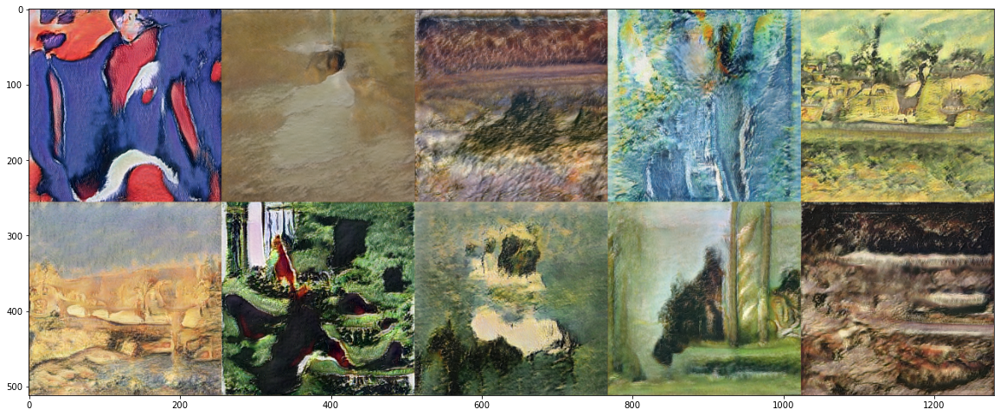

Epoch: 0 | D Cost: 209.458 | GP Cost: 28.877 | G Cost: 382.854 | P(aug): 0.068 | Rt: 0.657 | PPL EMA: 0.75 | PPL Loss: 18.968 | Time to Complete: 7m 32s
Epoch: 1 | D Cost: 207.488 | GP Cost: 28.477 | G Cost: 393.734 | P(aug): 0.069 | Rt: 0.618 | PPL EMA: 0.752 | PPL Loss: 19.948 | Time to Complete: 5m 53s
Epoch: 2 | D Cost: 205.375 | GP Cost: 28.119 | G Cost: 391.962 | P(aug): 0.07 | Rt: 0.65 | PPL EMA: 0.751 | PPL Loss: 19.115 | Time to Complete: 5m 54s
Epoch: 3 | D Cost: 222.087 | GP Cost: 27.736 | G Cost: 379.081 | P(aug): 0.069 | Rt: 0.59 | PPL EMA: 0.756 | PPL Loss: 16.825 | Time to Complete: 5m 55s
Epoch: 4 | D Cost: 207.604 | GP Cost: 33.748 | G Cost: 382.908 | P(aug): 0.069 | Rt: 0.618 | PPL EMA: 0.751 | PPL Loss: 19.668 | Time to Complete: 5m 50s
Epoch: 5 | D Cost: 212.648 | GP Cost: 27.957 | G Cost: 366.589 | P(aug): 0.07 | Rt: 0.639 | PPL EMA: 0.75 | PPL Loss: 17.509 | Time to Complete: 5m 29s
Epoch: 6 | D Cost: 215.09 | GP Cost: 29.81 | G Cost: 384.354 | P(aug): 0.07 | Rt: 

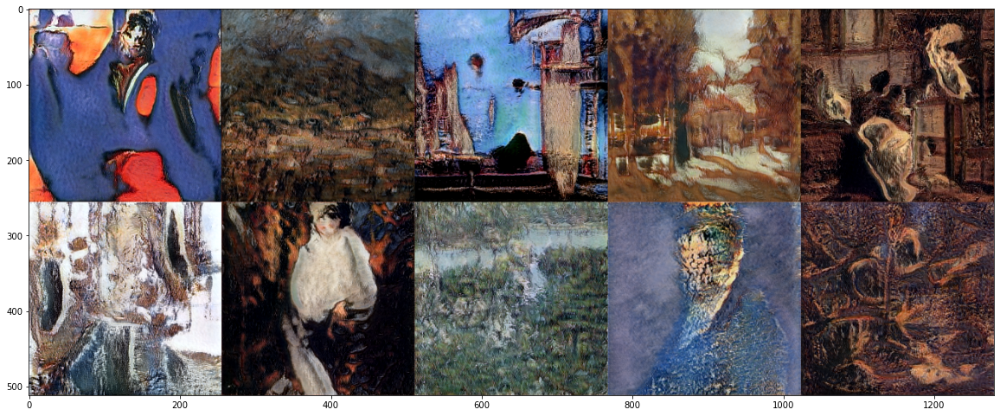

Epoch: 0 | D Cost: 207.476 | GP Cost: 30.633 | G Cost: 380.472 | P(aug): 0.074 | Rt: 0.64 | PPL EMA: 0.755 | PPL Loss: 23.608 | Time to Complete: 5m 30s
Epoch: 1 | D Cost: 219.762 | GP Cost: 29.017 | G Cost: 363.859 | P(aug): 0.074 | Rt: 0.603 | PPL EMA: 0.754 | PPL Loss: 18.016 | Time to Complete: 5m 30s
Epoch: 2 | D Cost: 221.423 | GP Cost: 25.388 | G Cost: 360.919 | P(aug): 0.074 | Rt: 0.57 | PPL EMA: 0.745 | PPL Loss: 18.881 | Time to Complete: 5m 30s
Epoch: 3 | D Cost: 218.756 | GP Cost: 26.946 | G Cost: 375.777 | P(aug): 0.073 | Rt: 0.603 | PPL EMA: 0.746 | PPL Loss: 20.327 | Time to Complete: 5m 29s
Epoch: 4 | D Cost: 219.205 | GP Cost: 26.137 | G Cost: 365.203 | P(aug): 0.073 | Rt: 0.606 | PPL EMA: 0.739 | PPL Loss: 18.584 | Time to Complete: 5m 30s
Epoch: 5 | D Cost: 206.627 | GP Cost: 26.704 | G Cost: 383.253 | P(aug): 0.074 | Rt: 0.647 | PPL EMA: 0.747 | PPL Loss: 21.041 | Time to Complete: 5m 35s
Epoch: 6 | D Cost: 207.69 | GP Cost: 19.44 | G Cost: 417.4 | P(aug): 0.075 | R

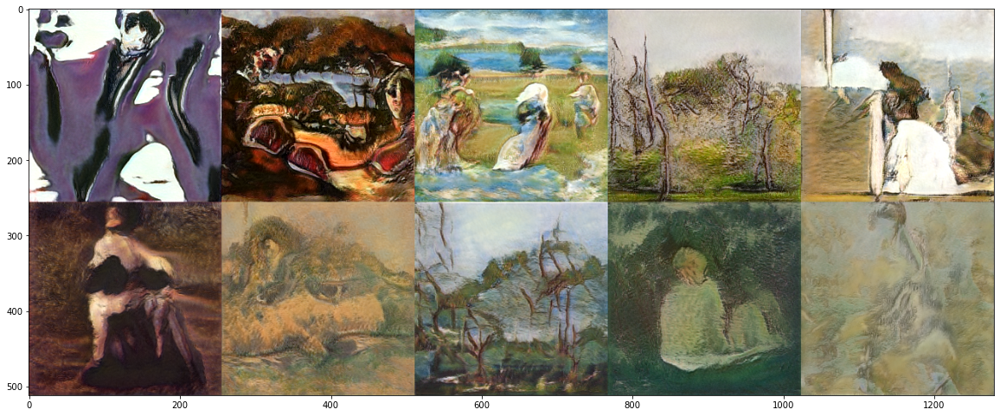

Epoch: 0 | D Cost: 214.694 | GP Cost: 26.292 | G Cost: 382.467 | P(aug): 0.079 | Rt: 0.648 | PPL EMA: 0.743 | PPL Loss: 20.79 | Time to Complete: 5m 30s
Epoch: 1 | D Cost: 213.827 | GP Cost: 28.48 | G Cost: 384.059 | P(aug): 0.079 | Rt: 0.6 | PPL EMA: 0.746 | PPL Loss: 17.988 | Time to Complete: 5m 31s
Epoch: 2 | D Cost: 208.688 | GP Cost: 32.353 | G Cost: 382.707 | P(aug): 0.08 | Rt: 0.654 | PPL EMA: 0.744 | PPL Loss: 20.282 | Time to Complete: 5m 30s
Epoch: 3 | D Cost: 213.451 | GP Cost: 32.427 | G Cost: 352.39 | P(aug): 0.082 | Rt: 0.646 | PPL EMA: 0.739 | PPL Loss: 18.107 | Time to Complete: 5m 31s
Epoch: 4 | D Cost: 217.48 | GP Cost: 22.883 | G Cost: 374.297 | P(aug): 0.083 | Rt: 0.596 | PPL EMA: 0.734 | PPL Loss: 16.493 | Time to Complete: 5m 30s
Epoch: 5 | D Cost: 214.095 | GP Cost: 25.095 | G Cost: 395.775 | P(aug): 0.085 | Rt: 0.618 | PPL EMA: 0.735 | PPL Loss: 17.791 | Time to Complete: 5m 30s
Epoch: 6 | D Cost: 215.016 | GP Cost: 28.239 | G Cost: 362.452 | P(aug): 0.086 | Rt

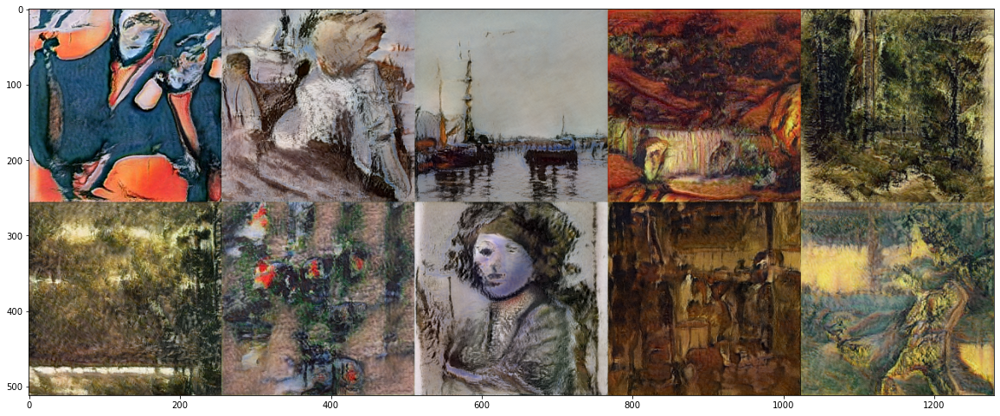

Epoch: 0 | D Cost: 212.376 | GP Cost: 29.378 | G Cost: 375.822 | P(aug): 0.088 | Rt: 0.634 | PPL EMA: 0.737 | PPL Loss: 17.972 | Time to Complete: 5m 30s
Epoch: 1 | D Cost: 222.415 | GP Cost: 26.171 | G Cost: 371.052 | P(aug): 0.09 | Rt: 0.624 | PPL EMA: 0.73 | PPL Loss: 20.628 | Time to Complete: 5m 30s
Epoch: 2 | D Cost: 226.072 | GP Cost: 26.406 | G Cost: 363.642 | P(aug): 0.09 | Rt: 0.585 | PPL EMA: 0.726 | PPL Loss: 17.881 | Time to Complete: 5m 30s
Epoch: 3 | D Cost: 220.266 | GP Cost: 28.413 | G Cost: 367.944 | P(aug): 0.09 | Rt: 0.596 | PPL EMA: 0.719 | PPL Loss: 19.105 | Time to Complete: 5m 30s
Epoch: 4 | D Cost: 220.776 | GP Cost: 27.908 | G Cost: 356.953 | P(aug): 0.091 | Rt: 0.602 | PPL EMA: 0.715 | PPL Loss: 16.557 | Time to Complete: 5m 30s
Epoch: 5 | D Cost: 217.492 | GP Cost: 29.014 | G Cost: 356.895 | P(aug): 0.092 | Rt: 0.613 | PPL EMA: 0.718 | PPL Loss: 16.867 | Time to Complete: 5m 30s
Epoch: 6 | D Cost: 218.569 | GP Cost: 32.986 | G Cost: 356.651 | P(aug): 0.093 |

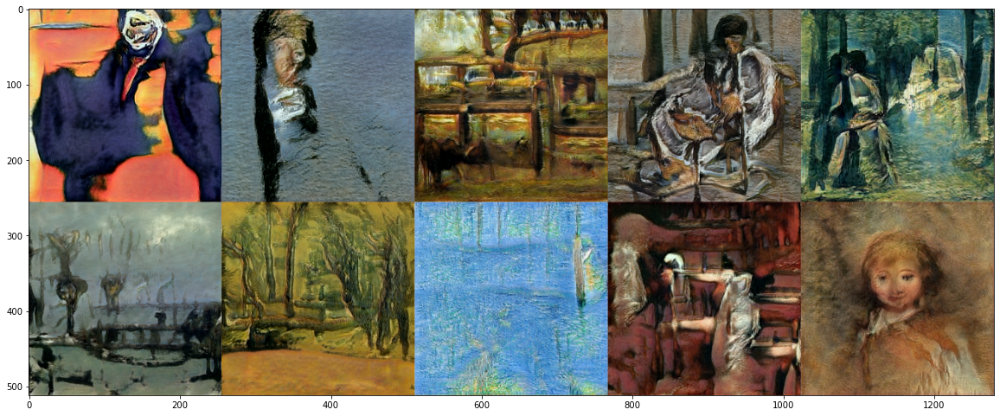

Epoch: 0 | D Cost: 224.853 | GP Cost: 25.85 | G Cost: 365.966 | P(aug): 0.094 | Rt: 0.568 | PPL EMA: 0.721 | PPL Loss: 20.254 | Time to Complete: 5m 32s
Epoch: 1 | D Cost: 216.714 | GP Cost: 30.038 | G Cost: 354.959 | P(aug): 0.095 | Rt: 0.612 | PPL EMA: 0.72 | PPL Loss: 15.501 | Time to Complete: 5m 32s
Epoch: 2 | D Cost: 224.462 | GP Cost: 29.508 | G Cost: 361.054 | P(aug): 0.095 | Rt: 0.606 | PPL EMA: 0.718 | PPL Loss: 15.316 | Time to Complete: 5m 33s
Epoch: 3 | D Cost: 220.319 | GP Cost: 24.736 | G Cost: 373.519 | P(aug): 0.097 | Rt: 0.614 | PPL EMA: 0.716 | PPL Loss: 16.849 | Time to Complete: 5m 31s
Epoch: 4 | D Cost: 220.58 | GP Cost: 28.791 | G Cost: 366.087 | P(aug): 0.098 | Rt: 0.626 | PPL EMA: 0.715 | PPL Loss: 17.466 | Time to Complete: 5m 31s
Epoch: 5 | D Cost: 222.397 | GP Cost: 23.056 | G Cost: 372.223 | P(aug): 0.099 | Rt: 0.592 | PPL EMA: 0.717 | PPL Loss: 18.32 | Time to Complete: 5m 31s
Epoch: 6 | D Cost: 217.83 | GP Cost: 28.943 | G Cost: 363.13 | P(aug): 0.099 | R

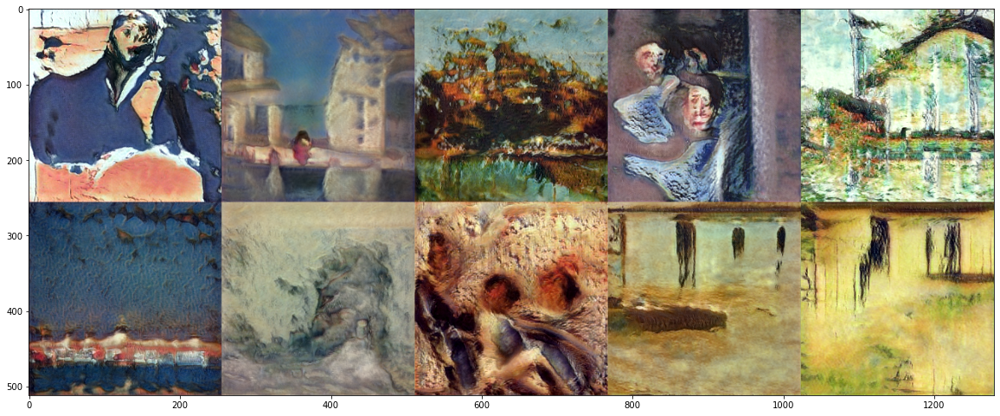

Epoch: 0 | D Cost: 229.341 | GP Cost: 29.514 | G Cost: 347.732 | P(aug): 0.101 | Rt: 0.598 | PPL EMA: 0.726 | PPL Loss: 16.038 | Time to Complete: 5m 31s
Epoch: 1 | D Cost: 219.777 | GP Cost: 27.671 | G Cost: 357.71 | P(aug): 0.101 | Rt: 0.591 | PPL EMA: 0.718 | PPL Loss: 16.722 | Time to Complete: 5m 30s
Epoch: 2 | D Cost: 216.765 | GP Cost: 28.696 | G Cost: 366.271 | P(aug): 0.101 | Rt: 0.593 | PPL EMA: 0.716 | PPL Loss: 17.407 | Time to Complete: 5m 30s
Epoch: 3 | D Cost: 222.702 | GP Cost: 29.466 | G Cost: 339.806 | P(aug): 0.101 | Rt: 0.61 | PPL EMA: 0.724 | PPL Loss: 18.062 | Time to Complete: 5m 31s
Epoch: 4 | D Cost: 231.685 | GP Cost: 29.646 | G Cost: 348.263 | P(aug): 0.101 | Rt: 0.582 | PPL EMA: 0.725 | PPL Loss: 16.346 | Time to Complete: 5m 31s
Epoch: 5 | D Cost: 223.294 | GP Cost: 24.522 | G Cost: 348.189 | P(aug): 0.101 | Rt: 0.59 | PPL EMA: 0.724 | PPL Loss: 16.848 | Time to Complete: 5m 31s
Epoch: 6 | D Cost: 226.436 | GP Cost: 28.265 | G Cost: 351.253 | P(aug): 0.101 

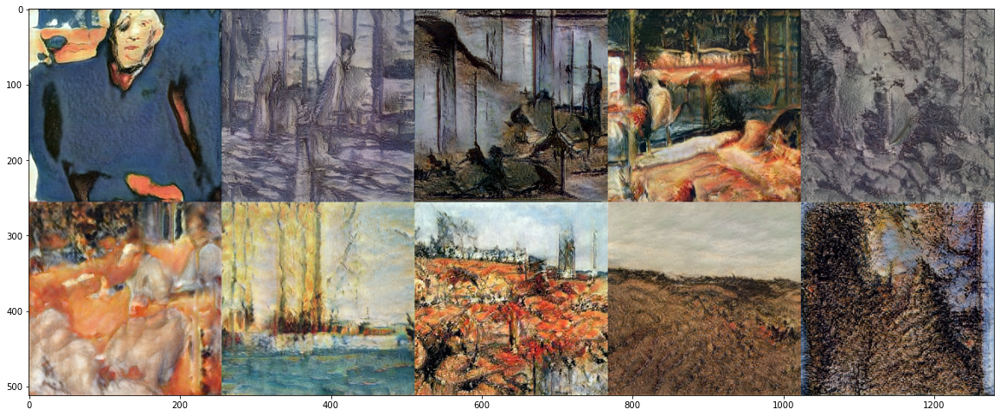

Epoch: 0 | D Cost: 225.559 | GP Cost: 26.263 | G Cost: 357.946 | P(aug): 0.1 | Rt: 0.569 | PPL EMA: 0.716 | PPL Loss: 16.756 | Time to Complete: 5m 34s
Epoch: 1 | D Cost: 227.883 | GP Cost: 20.489 | G Cost: 349.47 | P(aug): 0.099 | Rt: 0.566 | PPL EMA: 0.716 | PPL Loss: 16.166 | Time to Complete: 5m 35s
Epoch: 2 | D Cost: 207.953 | GP Cost: 22.978 | G Cost: 401.209 | P(aug): 0.1 | Rt: 0.64 | PPL EMA: 0.72 | PPL Loss: 15.596 | Time to Complete: 5m 35s
Epoch: 3 | D Cost: 205.82 | GP Cost: 35.236 | G Cost: 370.961 | P(aug): 0.103 | Rt: 0.666 | PPL EMA: 0.723 | PPL Loss: 19.421 | Time to Complete: 5m 34s
Epoch: 4 | D Cost: 219.58 | GP Cost: 24.454 | G Cost: 375.516 | P(aug): 0.103 | Rt: 0.596 | PPL EMA: 0.712 | PPL Loss: 18.703 | Time to Complete: 5m 33s
Epoch: 5 | D Cost: 211.801 | GP Cost: 29.087 | G Cost: 388.767 | P(aug): 0.104 | Rt: 0.622 | PPL EMA: 0.726 | PPL Loss: 19.459 | Time to Complete: 5m 33s
Epoch: 6 | D Cost: 223.762 | GP Cost: 34.285 | G Cost: 339.668 | P(aug): 0.104 | Rt: 

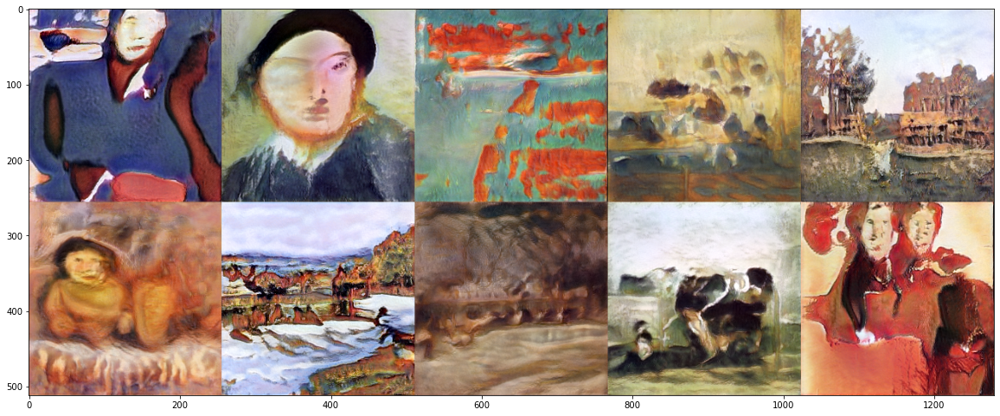

Epoch: 0 | D Cost: 229.476 | GP Cost: 22.6 | G Cost: 360.213 | P(aug): 0.104 | Rt: 0.586 | PPL EMA: 0.717 | PPL Loss: 18.237 | Time to Complete: 5m 30s
Epoch: 1 | D Cost: 220.216 | GP Cost: 27.149 | G Cost: 357.265 | P(aug): 0.105 | Rt: 0.608 | PPL EMA: 0.703 | PPL Loss: 16.386 | Time to Complete: 5m 31s
Epoch: 2 | D Cost: 222.317 | GP Cost: 25.813 | G Cost: 357.105 | P(aug): 0.104 | Rt: 0.576 | PPL EMA: 0.707 | PPL Loss: 16.001 | Time to Complete: 5m 30s
Epoch: 3 | D Cost: 212.935 | GP Cost: 30.007 | G Cost: 372.214 | P(aug): 0.106 | Rt: 0.644 | PPL EMA: 0.706 | PPL Loss: 15.629 | Time to Complete: 5m 29s
Epoch: 4 | D Cost: 221.855 | GP Cost: 26.781 | G Cost: 361.283 | P(aug): 0.106 | Rt: 0.588 | PPL EMA: 0.717 | PPL Loss: 18.699 | Time to Complete: 5m 29s
Epoch: 5 | D Cost: 216.258 | GP Cost: 26.234 | G Cost: 370.085 | P(aug): 0.107 | Rt: 0.632 | PPL EMA: 0.717 | PPL Loss: 18.318 | Time to Complete: 5m 30s
Epoch: 6 | D Cost: 221.49 | GP Cost: 28.689 | G Cost: 359.992 | P(aug): 0.107 

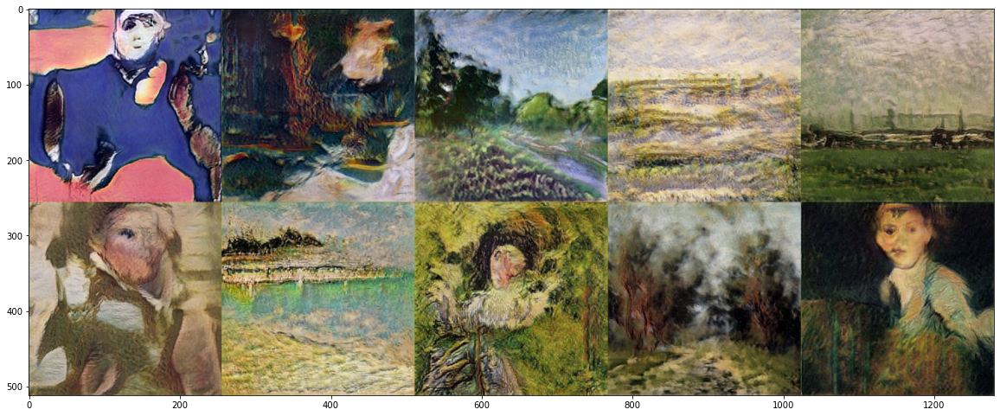

Epoch: 0 | D Cost: 226.508 | GP Cost: 28.392 | G Cost: 356.36 | P(aug): 0.108 | Rt: 0.607 | PPL EMA: 0.713 | PPL Loss: 18.136 | Time to Complete: 5m 29s
Epoch: 1 | D Cost: 219.584 | GP Cost: 25.435 | G Cost: 366.182 | P(aug): 0.108 | Rt: 0.62 | PPL EMA: 0.712 | PPL Loss: 17.828 | Time to Complete: 5m 29s
Epoch: 2 | D Cost: 216.709 | GP Cost: 24.22 | G Cost: 374.59 | P(aug): 0.108 | Rt: 0.577 | PPL EMA: 0.714 | PPL Loss: 16.855 | Time to Complete: 5m 29s
Epoch: 3 | D Cost: 226.556 | GP Cost: 25.628 | G Cost: 356.594 | P(aug): 0.106 | Rt: 0.584 | PPL EMA: 0.716 | PPL Loss: 16.041 | Time to Complete: 5m 30s
Epoch: 4 | D Cost: 212.361 | GP Cost: 25.667 | G Cost: 383.724 | P(aug): 0.106 | Rt: 0.607 | PPL EMA: 0.715 | PPL Loss: 19.415 | Time to Complete: 5m 30s
Epoch: 5 | D Cost: 216.584 | GP Cost: 33.787 | G Cost: 358.769 | P(aug): 0.108 | Rt: 0.616 | PPL EMA: 0.707 | PPL Loss: 16.213 | Time to Complete: 5m 30s
Epoch: 6 | D Cost: 222.964 | GP Cost: 25.33 | G Cost: 367.328 | P(aug): 0.108 | 

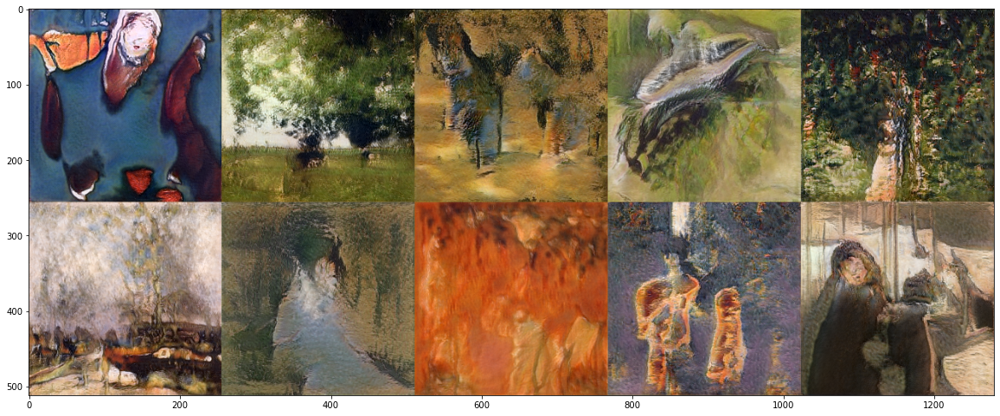

Epoch: 0 | D Cost: 226.493 | GP Cost: 27.797 | G Cost: 348.584 | P(aug): 0.108 | Rt: 0.599 | PPL EMA: 0.708 | PPL Loss: 17.308 | Time to Complete: 5m 31s
Epoch: 1 | D Cost: 216.809 | GP Cost: 29.136 | G Cost: 364.08 | P(aug): 0.109 | Rt: 0.614 | PPL EMA: 0.71 | PPL Loss: 15.631 | Time to Complete: 5m 31s


KeyboardInterrupt: 

In [30]:
epoch = 0
if not pretrained:
    save_models(askInp=False)

while nImgs > 0:
    print('Number of Images Left to Train:', nImgs)
    sess = timeIt('Training')
    display(verbose=2)
    
    train(epochs=10)
    save_models(askInp=False)
    epoch += 1
    sess.close()

### Save models

/kaggle/working
Zipping...
Done zipping.
D(G(z)) (lower = better disc): -1.9301583
D(x) (higher = better disc): 2.7826104
D Loss: tf.Tensor(0.20941083, shape=(), dtype=float32)
G Loss: tf.Tensor(2.0782588, shape=(), dtype=float32)


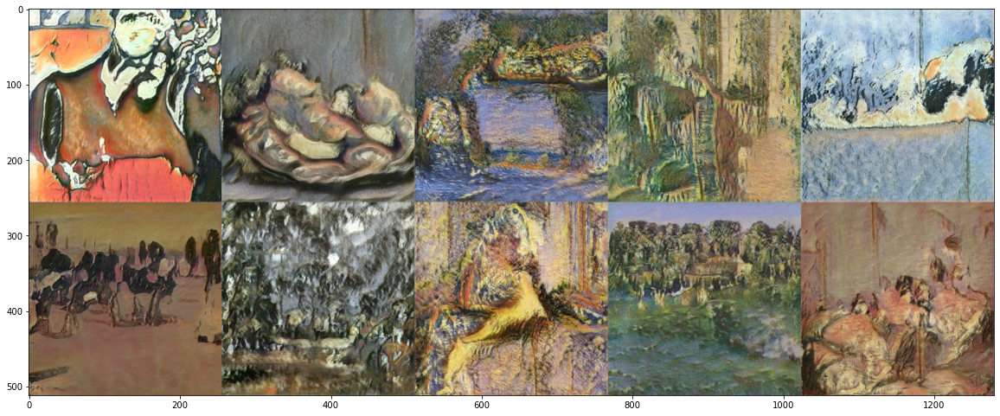


FID: 63.3126


In [32]:
save_models(askInp=False)
display()

In [ ]:
batch = next(train_generator)[0]

In [ ]:
dGrad, gGrad, dNorm, gNorm, img, fake, truePreds, fakePreds = toNp(*retGrads(batch, tf.convert_to_tensor(p, 'float32')))
    
print(dGrad.shape, dGrad.dtype)
dGrad = np.linalg.norm(tf.cast(dGrad, tf.float32), axis=2)
gGrad = np.linalg.norm(tf.cast(gGrad, tf.float32), axis=2)
print('D(x): {} | R_t(D(x)): {} | R_t(D(G(z))): {} | D(G(z)): {}'.format(np.mean(truePreds), rt(truePreds), np.mean(fakePreds), rt(fakePreds)))
print(discLoss(truePreds, fakePreds).numpy())
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
dGrad = (dGrad - np.min(dGrad)) / (np.max(dGrad) - np.min(dGrad) + eps)
gGrad = (gGrad - np.min(gGrad)) / (np.max(gGrad) - np.min(gGrad) + eps)
axes[0][0].imshow(img.astype(np.float32) / 2 + 0.5)
axes[0][1].imshow(fake.astype(np.float32) / 2 + 0.5)
axes[1][0].imshow(dGrad)
axes[1][0].set_title('Real Grad; Norm: {}'.format(round(dNorm, 4)))
axes[1][1].imshow(gGrad)
axes[1][1].set_title('Fake Grad; Norm: {}'.format(round(gNorm, 4)))
plt.show()

In [ ]:
constZ1s = npr.randn(rows*cols, zdim) * 10
constZ2s = npr.randn(rows*cols, zdim)
constNoises = npr.randn(rows * cols, imgSize, imgSize, 1)

In [ ]:
try:
    constZ1s
except Exception as e:
    constZ1s = npr.randn(rows*cols, zdim)
    constZ2s = npr.randn(rows*cols, zdim)
    constNoises = npr.randn(1, rows * cols, imgSize, imgSize)
    
for i in range(5):
    constZ1s = npr.randn(rows * cols, zdim)
    constZ2s = npr.randn(rows * cols, zdim)
    constNoises = npr.randn(1, rows * cols, imgSize, imgSize)
    display(z1=constZ1s, z2=constZ2s, noise=constNoises, verbose=False)

In [ ]:
'''try:
    constZ1s
except Exception as e:
    constZ1s = npr.randn(rows*cols, zdim)
    constZ2s = npr.randn(rows*cols, zdim)
    constNoises = npr.randn(1, rows * cols, imgSize, imgSize)
    
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(30, 15))

z1 = constZ1s; z2 = constZ2s; noise = constNoises

randInds = npr.randint(0, reals.shape[0], (rows*cols,))

w1 = z1; w2 = z2
preds = generator([w1, w2, noise], training=False)

for i in range(5):
    axes[0][i].imshow(preds[i] / 2 + 0.5)
    
w1 = mapper(z1, training=False)
w2 = mapper(z2, training=False)
preds = generator([w1, w2, noise], training=False)

for i in range(5):
    axes[1][i].imshow(preds[i] / 2 + 0.5)

plt.show()'''

In [ ]:
'''fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 4))
pltX = range(len(dcosts))
axes[0].plot(pltX, dcosts); axes[0].set_title('D Loss')
axes[1].plot(pltX, gcosts); axes[1].set_title('G Loss')
axes[2].plot(pltX, gpcosts); axes[2].set_title('GP')
plt.show()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 4))
axes[0].plot(pltX, ps); axes[0].set_title('Evolution of P(aug) over training')
axes[1].plot(pltX, rts); axes[1].set_title('Evolution of rt')
plt.show()

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 8))
axes.set_title('D Loss (Blue) vs. G Loss (Orange)')
axes.plot(pltX, dcosts, color='blue')
axes.plot(pltX, gcosts, color='orange')
plt.show()'''

In [ ]:
'''z = npr.randn(1, zdim)
w = mapper(z, training=False).numpy()
fig, axes = plt.subplots(ncols=2, figsize=(16, 16))
axes[0].hist(z[0, :15])
axes[1].hist(w[0, :15])
plt.show()'''